In [1]:
# 导入所需库
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import shap

# 读取数据
data = pd.read_csv('cardio_train.csv')

# 数据预处理与探索性分析
# 显示数据基本信息
print(data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB
None


In [2]:
df=data
data.head()


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [3]:
#特征工程
#删除id列，新增一列BMI
df['BMI'] = df['weight'] / (df['height']/100)**2
df.drop('id', axis=1, inplace=True)

df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI
0,18393,2,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,20228,1,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,18857,1,165,64.0,130,70,3,1,0,0,0,1,23.507805
3,17623,2,169,82.0,150,100,1,1,0,0,1,1,28.710479
4,17474,1,156,56.0,100,60,1,1,0,0,0,0,23.011177


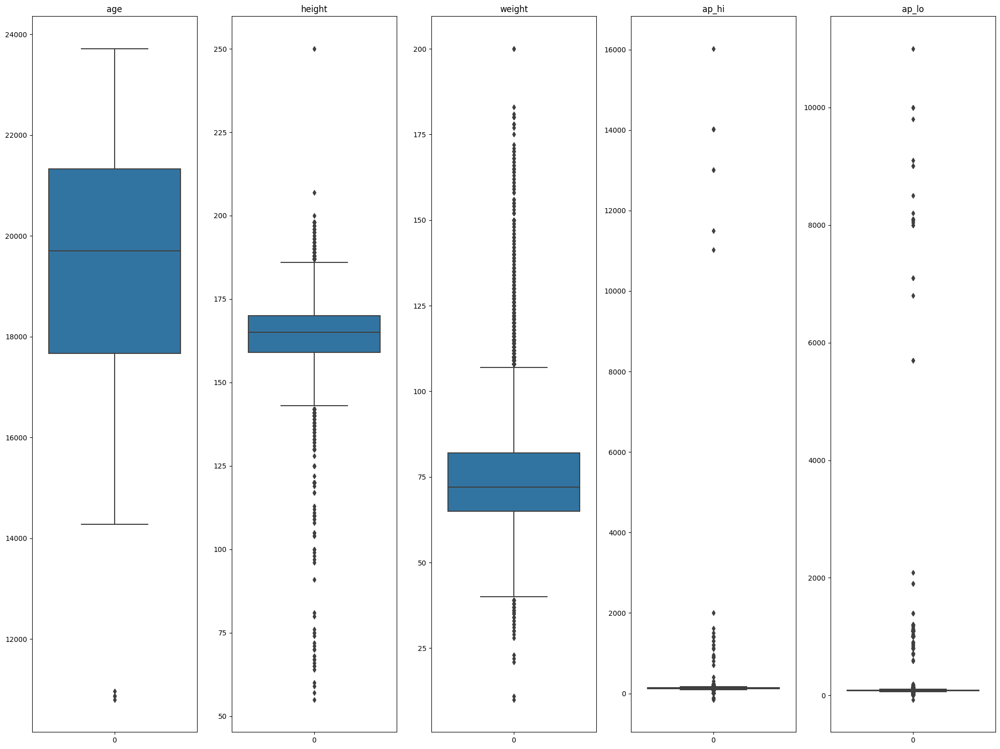

In [4]:
# 可视化各列的箱线图
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define continuous variable columns
continuous_columns = ['age', 'height', 'weight', 'ap_hi', 'ap_lo']

# Set the size of the canvas
plt.figure(figsize=(20, 15))

# Plot boxplots for each continuous variable
for i, column in enumerate(continuous_columns):
    plt.subplot(1, 5, i + 1)  # Create subplot with 3 rows and 3 columns
    sns.boxplot(data=df[column])
    plt.title(column)

plt.tight_layout()  # Adjust layout
plt.show()



In [5]:


# 删除缺失值
df.dropna(inplace=True)

# 数据清洗
# 删除异常的数据
df = df[(df['ap_hi'] >= 0) & (df['ap_hi'] <= 200)]
df = df[(df['ap_lo'] >= 0) & (df['ap_lo'] <= 180)]
df = df[(df['height'] >= 100) & (df['height'] <= 220)]
df = df[(df['weight'] >= 30) & (df['weight'] <= 200)]
df = df[(df['ap_lo'] <= df['ap_hi'])]


In [6]:
#对特征Z-SCORE归一化
from scipy.stats import zscore
df[continuous_columns] = df[continuous_columns].apply(zscore)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI
0,-0.433769,2,0.452284,-0.846742,-1.004105,-0.128357,1,1,0,0,1,0,21.967120
1,0.309609,1,-1.052248,0.761536,0.810759,0.916131,3,1,0,0,1,1,34.927679
2,-0.245798,1,0.076151,-0.706892,0.205804,-1.172845,3,1,0,0,0,1,23.507805
3,-0.745704,2,0.577662,0.551761,1.415714,1.960620,1,1,0,0,1,1,28.710479
4,-0.806066,1,-1.052248,-1.266293,-1.609060,-2.217333,1,1,0,0,0,0,23.011177


In [7]:
#--------------------------------------

In [100]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# 假设你已经加载了你的DataFrame df
df = pd.read_csv('cardio_zscore.csv')

# 提取特征变量x和目标变量y
x = df.iloc[:, :-2]
y = df.iloc[:, -2]



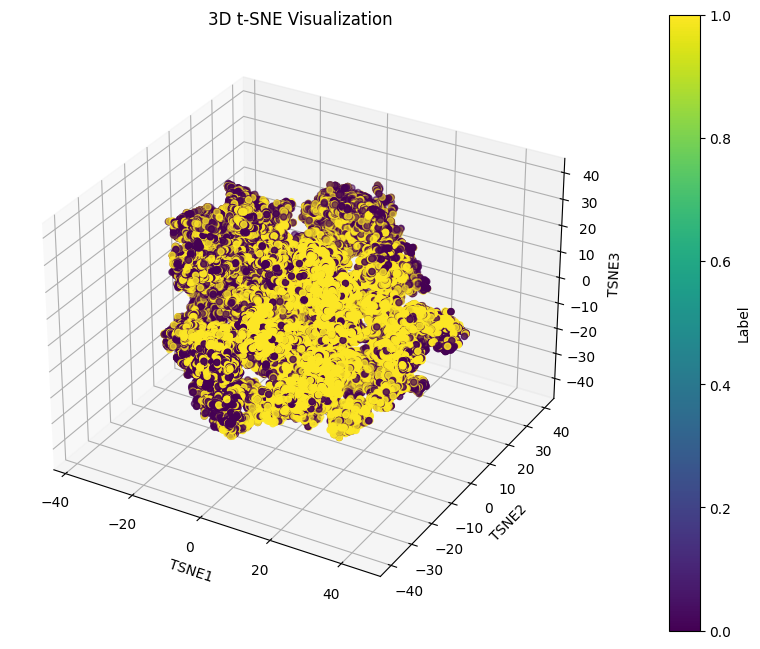

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

# 假设你已经加载了你的DataFrame df
# df = pd.read_csv('your_file.csv')

# 提取特征变量x和目标变量y
x = df.iloc[:, :-2]
y = df.iloc[:, -2]

# 使用t-SNE进行降维
tsne = TSNE(n_components=3, random_state=42)
x_tsne = tsne.fit_transform(x)

# 创建一个新的DataFrame用于可视化
df_tsne = pd.DataFrame(x_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne['label'] = y

# 绘制t-SNE降维后的三维散点图
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(df_tsne['TSNE1'], df_tsne['TSNE2'], df_tsne['TSNE3'], c=df_tsne['label'], cmap='viridis')

# 添加颜色条
colorbar = fig.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Label')

ax.set_title('3D t-SNE Visualization')
ax.set_xlabel('TSNE1')
ax.set_ylabel('TSNE2')
ax.set_zlabel('TSNE3')
plt.show()


In [ ]:
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI
0,-0.433769,2,0.452284,-0.846742,-1.004105,-0.128357,1,1,0,0,1,0,21.967120
1,0.309609,1,-1.052248,0.761536,0.810759,0.916131,3,1,0,0,1,1,34.927679
2,-0.245798,1,0.076151,-0.706892,0.205804,-1.172845,3,1,0,0,0,1,23.507805
3,-0.745704,2,0.577662,0.551761,1.415714,1.960620,1,1,0,0,1,1,28.710479
4,-0.806066,1,-1.052248,-1.266293,-1.609060,-2.217333,1,1,0,0,0,0,23.011177


In [5]:
import pandas as pd
import numpy as np
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# 加载数据
y = df.iloc[:, -2]  # 倒数第二列为目标变量y
X = df.drop(columns=df.columns[-2])  # 其余列为特征变量x

# 计算熵
def entropy(y):
    counts = Counter(y)
    probabilities = [count / len(y) for count in counts.values()]
    return -sum(p * np.log2(p) for p in probabilities if p > 0)

# 计算信息增益
def information_gain(X, y, feature):
    original_entropy = entropy(y)
    values, counts = np.unique(X[feature], return_counts=True)
    weighted_entropy = sum((counts[i] / sum(counts)) * entropy(y[X[feature] == v]) for i, v in enumerate(values))
    return original_entropy - weighted_entropy

# 选择最佳特征
def best_feature_to_split(X, y):
    features = X.columns
    information_gains = [information_gain(X, y, feature) for feature in features]
    return features[np.argmax(information_gains)]

# 构建ID3决策树
def id3(X, y, features, depth=0, max_depth=None):
    if len(np.unique(y)) == 1:
        return y.iloc[0]
    if len(features) == 0 or (max_depth is not None and depth >= max_depth):
        return y.mode()[0]
    
    best_feature = best_feature_to_split(X, y)
    tree = {best_feature: {}}
    
    for value in np.unique(X[best_feature]):
        sub_X = X[X[best_feature] == value].drop(columns=[best_feature])
        sub_y = y[X[best_feature] == value]
        subtree = id3(sub_X, sub_y, sub_X.columns, depth + 1, max_depth)
        tree[best_feature][value] = subtree
    
    return tree

# 进行剪枝
def prune(tree, X, y):
    def prune_node(node, X, y):
        if isinstance(node, dict):
            feature = list(node.keys())[0]
            for value in node[feature]:
                if isinstance(node[feature][value], dict):
                    sub_X = X[X[feature] == value].drop(columns=[feature])
                    sub_y = y[X[feature] == value]
                    node[feature][value] = prune_node(node[feature][value], sub_X, sub_y)
            
            leaf_counts = Counter(sub_y)
            most_common_label = leaf_counts.most_common(1)[0][0]
            if all(isinstance(subtree, str) for subtree in node[feature].values()):
                majority_vote = Counter(node[feature].values()).most_common(1)[0][0]
                if majority_vote == most_common_label:
                    return majority_vote
            
        return node
    
    return prune_node(tree, X, y)

# 定义预测函数
def predict(tree, sample):
    if not isinstance(tree, dict):
        return tree
    feature = list(tree.keys())[0]
    if sample[feature] in tree[feature]:
        return predict(tree[feature][sample[feature]], sample)
    else:
        return np.nan  # 若特征值不在训练集中出现过，返回空


In [6]:

# 划分训练集和测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [12]:
# 训练ID3决策树
tree = id3(X_train, y_train, X_train.columns, max_depth=999)

In [15]:
# 对决策树进行剪枝
#pruned_tree = prune(tree, X_train, y_train)
pruned_tree = tree

In [16]:

# 预测测试集
y_pred = X_test.apply(lambda x: predict(pruned_tree, x), axis=1)
y_pred
# # 绘制混淆矩阵
# conf_matrix = confusion_matrix(y_test, y_pred)
# plt.figure(figsize=(10, 7))
# sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
# plt.xlabel('Predicted')
# plt.ylabel('Actual')
# plt.title('Confusion Matrix')
# plt.show()

# # 计算并绘制ROC曲线和AUC值
# y_prob = X_test.apply(lambda x: predict(pruned_tree, x), axis=1)
# y_test_binary = y_test.apply(lambda x: 1 if x == y.unique()[1] else 0)  # 将类别转为0和1
# y_prob_binary = y_prob.apply(lambda x: 1 if x == y.unique()[1] else 0)

# fpr, tpr, _ = roc_curve(y_test_binary, y_prob_binary)
# roc_auc = auc(fpr, tpr)

# plt.figure(figsize=(10, 7))
# plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
# plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend(loc="lower right")
# plt.show()

46730    1.0
48393    1.0
41416    1.0
34506    NaN
43725    0.0
        ... 
21525    NaN
16276    NaN
24390    NaN
28061    0.0
63452    1.0
Length: 14000, dtype: float64

In [18]:
# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('cardio_zscore') 

# init setup
from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'cardio')

# train logistic regression
dt = create_model('dt',fold=10)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,BMI
0,-0.434371,1.376046,0.487466,-0.889762,-0.996746,-0.131346,-0.531376,-0.389363,-0.308068,-0.235167,0.493312,0,-1.113334
1,0.309014,-0.726720,-1.101158,0.968409,0.824843,0.943923,2.436779,-0.389363,-0.308068,-0.235167,0.493312,1,1.706375
2,-0.246398,-0.726720,0.090310,-0.728182,0.217646,-1.206614,2.436779,-0.389363,-0.308068,-0.235167,-2.027115,1,-0.778142
3,-0.746309,1.376046,0.619852,0.726039,1.432039,2.019191,-0.531376,-0.389363,-0.308068,-0.235167,0.493312,1,0.353756
4,-0.806671,-0.726720,-1.101158,-1.374502,-1.603942,-2.281882,-0.531376,-0.389363,-0.308068,-0.235167,-2.027115,0,-0.886188


,Description,Value
0,Session id,2254
1,Target,cardio
2,Target type,Binary
3,Original data shape,"(66348, 13)"
4,Transformed data shape,"(66348, 13)"
5,Transformed train set shape,"(46443, 13)"
6,Transformed test set shape,"(19905, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6344,0.6345,0.6353,0.6249,0.6301,0.2688,0.2689
1,0.6220,0.6219,0.6204,0.6128,0.6166,0.2438,0.2438
2,0.6344,0.6343,0.6270,0.6270,0.6270,0.2686,0.2686
3,0.6202,0.6201,0.6158,0.6115,0.6137,0.2401,0.2401
4,0.6309,0.6308,0.6246,0.6230,0.6238,0.2616,0.2616
5,0.6329,0.6326,0.6185,0.6270,0.6227,0.2652,0.2652
6,0.6337,0.6337,0.6325,0.6246,0.6285,0.2673,0.2673
7,0.6286,0.6283,0.6220,0.6206,0.6213,0.2568,0.2568
8,0.6324,0.6322,0.6292,0.6240,0.6266,0.2647,0.2647


In [41]:
print(dt)
print(dt2)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=1962, splitter='best')
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=100000, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       random_state=1962, splitter='best')


In [44]:

# access the scoring grid
dt_results = pull()
print(dt_results)
dt_results.loc[['Mean']]

      Accuracy     AUC  Recall   Prec.      F1   Kappa     MCC
Fold                                                          
0       0.6224  0.6221  0.6085  0.6161  0.6123  0.2443  0.2443
1       0.6349  0.6348  0.6257  0.6279  0.6268  0.2694  0.2694
2       0.6308  0.6305  0.6226  0.6234  0.6230  0.2613  0.2613
3       0.6309  0.6308  0.6237  0.6232  0.6235  0.2616  0.2616
4       0.6210  0.6205  0.5969  0.6170  0.6068  0.2412  0.2414
5       0.6249  0.6247  0.6163  0.6173  0.6168  0.2495  0.2495
6       0.6236  0.6233  0.6101  0.6172  0.6136  0.2467  0.2467
7       0.6370  0.6370  0.6435  0.6259  0.6346  0.2740  0.2741
8       0.6225  0.6223  0.6226  0.6132  0.6178  0.2450  0.2450
9       0.6417  0.6418  0.6450  0.6317  0.6383  0.2834  0.2834
Mean    0.6290  0.6288  0.6215  0.6213  0.6213  0.2576  0.2577
Std     0.0068  0.0069  0.0141  0.0057  0.0094  0.0138  0.0138


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
Mean,0.629,0.6288,0.6215,0.6213,0.6213,0.2576,0.2577


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7229,0.7881,0.6063,0.7792,0.6820,0.4432,0.4542
1,0.7227,0.7811,0.6186,0.7702,0.6862,0.4431,0.4516
2,0.7356,0.7961,0.6696,0.7620,0.7128,0.4698,0.4732
3,0.7283,0.7881,0.6620,0.7534,0.7047,0.4550,0.4582
4,0.7278,0.7906,0.6580,0.7549,0.7031,0.4540,0.4577
5,0.7242,0.7865,0.6448,0.7562,0.6961,0.4465,0.4512
6,0.7216,0.7837,0.6422,0.7531,0.6932,0.4413,0.4460
7,0.7366,0.7976,0.6734,0.7614,0.7147,0.4719,0.4749
8,0.7259,0.7833,0.6248,0.7724,0.6908,0.4495,0.4577


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7279,0.7914,0.6608,0.7535,0.7041,0.4542,0.4576
1,0.7247,0.7835,0.6599,0.7484,0.7014,0.4478,0.4508
2,0.7320,0.8014,0.6854,0.7468,0.7148,0.4629,0.4644
3,0.7270,0.7889,0.6475,0.7597,0.6991,0.4521,0.4569
4,0.7261,0.7920,0.6523,0.7552,0.7000,0.4505,0.4546
5,0.7246,0.7874,0.6396,0.7602,0.6947,0.4472,0.4528
6,0.7203,0.7857,0.6352,0.7550,0.6899,0.4386,0.4440
7,0.7265,0.7993,0.6862,0.7374,0.7108,0.4521,0.4531
8,0.7231,0.7867,0.7004,0.7252,0.7126,0.4456,0.4458


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7264,0.7910,0.6990,0.7308,0.7146,0.4521,0.4525
1,0.7171,0.7831,0.6876,0.7219,0.7043,0.4335,0.4339
2,0.7279,0.7989,0.6850,0.7403,0.7115,0.4547,0.4560
3,0.7233,0.7855,0.6312,0.7630,0.6909,0.4445,0.4510
4,0.7270,0.7916,0.6585,0.7531,0.7026,0.4523,0.4558
5,0.7242,0.7866,0.6299,0.7655,0.6911,0.4461,0.4531
6,0.7175,0.7841,0.6668,0.7325,0.6981,0.4337,0.4354
7,0.7250,0.7962,0.6725,0.7420,0.7056,0.4488,0.4507
8,0.7207,0.7846,0.7122,0.7163,0.7143,0.4411,0.4412


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7272,0.7896,0.6938,0.7348,0.7137,0.4536,0.4543
1,0.7141,0.7760,0.6955,0.7137,0.7045,0.4277,0.4278
2,0.7251,0.7938,0.6797,0.7384,0.7078,0.4491,0.4505
3,0.7257,0.7840,0.6681,0.7455,0.7047,0.4500,0.4523
4,0.7283,0.7895,0.7029,0.7318,0.7170,0.4559,0.4562
5,0.7203,0.7812,0.6523,0.7450,0.6956,0.4390,0.4423
6,0.7209,0.7820,0.6545,0.7449,0.6968,0.4403,0.4434
7,0.7300,0.7970,0.6699,0.7519,0.7085,0.4586,0.4612
8,0.7255,0.7841,0.7135,0.7227,0.7181,0.4506,0.4506


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7199,0.7809,0.7100,0.7160,0.7130,0.4395,0.4395
1,0.7173,0.7730,0.6656,0.7329,0.6977,0.4334,0.4352
2,0.7247,0.7889,0.6665,0.7447,0.7035,0.4479,0.4503
3,0.7272,0.7828,0.6809,0.7411,0.7097,0.4532,0.4547
4,0.7272,0.7839,0.6989,0.7320,0.7151,0.4536,0.4541
5,0.7218,0.7739,0.6505,0.7486,0.6961,0.4419,0.4456
6,0.7190,0.7774,0.6633,0.7368,0.6981,0.4366,0.4388
7,0.7366,0.7923,0.6774,0.7591,0.7159,0.4720,0.4746
8,0.7218,0.7781,0.7144,0.7169,0.7157,0.4433,0.4433


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7210,0.7774,0.6955,0.7242,0.7095,0.4413,0.4417
1,0.7175,0.7700,0.6582,0.7372,0.6955,0.4337,0.4361
2,0.7229,0.7837,0.6722,0.7388,0.7039,0.4447,0.4464
3,0.7227,0.7757,0.6677,0.7406,0.7023,0.4440,0.4461
4,0.7227,0.7789,0.6602,0.7447,0.6999,0.4438,0.4466
5,0.7205,0.7692,0.6374,0.7540,0.6908,0.4390,0.4442
6,0.7138,0.7738,0.6681,0.7259,0.6958,0.4265,0.4278
7,0.7293,0.7822,0.6870,0.7415,0.7132,0.4576,0.4588
8,0.7211,0.7701,0.6599,0.7425,0.6988,0.4409,0.4435


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7193,0.7688,0.6494,0.7450,0.6939,0.4369,0.4404
1,0.7057,0.7604,0.6634,0.7153,0.6884,0.4103,0.4114
2,0.7191,0.7730,0.6766,0.7302,0.7024,0.4371,0.4382
3,0.7246,0.7729,0.6791,0.7378,0.7073,0.4481,0.4495
4,0.7218,0.7722,0.6765,0.7346,0.7043,0.4425,0.4438
5,0.7173,0.7614,0.6369,0.7485,0.6882,0.4326,0.4373
6,0.7132,0.7686,0.6607,0.7286,0.6929,0.4251,0.4268
7,0.7311,0.7736,0.6804,0.7478,0.7125,0.4609,0.4627
8,0.7190,0.7644,0.6964,0.7208,0.7084,0.4374,0.4376


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7141,0.7530,0.6634,0.7288,0.6946,0.4270,0.4286
1,0.7046,0.7528,0.6643,0.7132,0.6879,0.4082,0.4092
2,0.7199,0.7623,0.6797,0.7301,0.7040,0.4388,0.4399
3,0.7147,0.7598,0.6633,0.7297,0.6949,0.4281,0.4298
4,0.7125,0.7584,0.6457,0.7352,0.6876,0.4234,0.4265
5,0.7125,0.7525,0.6527,0.7315,0.6899,0.4236,0.4260
6,0.7117,0.7558,0.6681,0.7224,0.6942,0.4222,0.4234
7,0.7278,0.7680,0.6932,0.7359,0.7139,0.4548,0.4555
8,0.7171,0.7565,0.6740,0.7284,0.7001,0.4331,0.4342


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7098,0.7383,0.6612,0.7229,0.6907,0.4184,0.4199
1,0.6952,0.7377,0.6560,0.7023,0.6783,0.3893,0.3901
2,0.7150,0.7508,0.6683,0.7278,0.6967,0.4288,0.4302
3,0.7140,0.7445,0.6774,0.7218,0.6989,0.4271,0.4279
4,0.7130,0.7481,0.6716,0.7228,0.6963,0.4249,0.4259
5,0.7050,0.7365,0.6396,0.7257,0.6799,0.4084,0.4112
6,0.7108,0.7496,0.6637,0.7232,0.6922,0.4204,0.4218
7,0.7239,0.7571,0.6809,0.7359,0.7073,0.4468,0.4481
8,0.7059,0.7396,0.6771,0.7095,0.6929,0.4110,0.4114


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7083,0.7285,0.6670,0.7177,0.6914,0.4155,0.4165
1,0.6917,0.7236,0.6503,0.6994,0.6740,0.3823,0.3832
2,0.7094,0.7390,0.6634,0.7211,0.6911,0.4176,0.4189
3,0.7121,0.7329,0.6716,0.7214,0.6957,0.4232,0.4242
4,0.7127,0.7396,0.6681,0.7242,0.6950,0.4244,0.4256
5,0.7013,0.7231,0.6431,0.7179,0.6784,0.4012,0.4033
6,0.7093,0.7362,0.6655,0.7199,0.6916,0.4175,0.4186
7,0.7179,0.7435,0.6804,0.7264,0.7027,0.4349,0.4357
8,0.7046,0.7285,0.6692,0.7110,0.6895,0.4082,0.4089


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6995,0.7093,0.6648,0.7050,0.6843,0.3980,0.3986
1,0.6893,0.7139,0.6402,0.7001,0.6688,0.3774,0.3787
2,0.7018,0.7203,0.6573,0.7120,0.6836,0.4025,0.4037
3,0.7056,0.7120,0.6593,0.7170,0.6870,0.4101,0.4114
4,0.7074,0.7256,0.6576,0.7206,0.6877,0.4135,0.4150
5,0.6940,0.7092,0.6475,0.7041,0.6746,0.3868,0.3880
6,0.7041,0.7251,0.6624,0.7132,0.6869,0.4072,0.4082
7,0.7119,0.7339,0.6624,0.7256,0.6926,0.4225,0.4241
8,0.6960,0.7160,0.6749,0.6957,0.6851,0.3913,0.3915


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6926,0.6958,0.6419,0.7044,0.6717,0.3838,0.3853
1,0.6825,0.7010,0.6393,0.6899,0.6636,0.3637,0.3647
2,0.7014,0.7119,0.6555,0.7122,0.6827,0.4016,0.4029
3,0.7005,0.7036,0.6558,0.7105,0.6821,0.3998,0.4009
4,0.7020,0.7140,0.6453,0.7178,0.6796,0.4025,0.4045
5,0.6845,0.6992,0.6470,0.6898,0.6677,0.3680,0.3687
6,0.6996,0.7085,0.6598,0.7074,0.6827,0.3982,0.3990
7,0.7005,0.7120,0.6585,0.7093,0.6829,0.3998,0.4008
8,0.6876,0.7018,0.6696,0.6856,0.6775,0.3746,0.3747


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6850,0.6846,0.6428,0.6924,0.6667,0.3689,0.3699
1,0.6825,0.6894,0.6428,0.6885,0.6648,0.3638,0.3646
2,0.6964,0.6998,0.6520,0.7060,0.6779,0.3917,0.3928
3,0.6899,0.6897,0.6440,0.6993,0.6705,0.3786,0.3798
4,0.6996,0.7016,0.6558,0.7091,0.6814,0.3981,0.3992
5,0.6839,0.6885,0.6409,0.6913,0.6651,0.3666,0.3676
6,0.6908,0.6930,0.6514,0.6974,0.6736,0.3805,0.3813
7,0.6960,0.7078,0.6611,0.7012,0.6805,0.3910,0.3916
8,0.6897,0.6963,0.6740,0.6870,0.6804,0.3789,0.3790


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6822,0.6772,0.6397,0.6894,0.6636,0.3633,0.3642
1,0.6734,0.6750,0.6419,0.6755,0.6583,0.3459,0.3463
2,0.6898,0.6891,0.6577,0.6934,0.6751,0.3787,0.3792
3,0.6832,0.6819,0.6316,0.6942,0.6614,0.3651,0.3665
4,0.6979,0.6975,0.6580,0.7055,0.6809,0.3947,0.3956
5,0.6751,0.6718,0.6466,0.6760,0.6610,0.3493,0.3496
6,0.6830,0.6824,0.6585,0.6831,0.6705,0.3654,0.3656
7,0.6876,0.6935,0.6466,0.6945,0.6697,0.3740,0.3749
8,0.6779,0.6827,0.6419,0.6821,0.6614,0.3547,0.3553


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6747,0.6669,0.6388,0.6785,0.6581,0.3484,0.3490
1,0.6756,0.6756,0.6362,0.6808,0.6577,0.3500,0.3508
2,0.6861,0.6840,0.6498,0.6911,0.6698,0.3712,0.3719
3,0.6701,0.6696,0.6246,0.6770,0.6497,0.3389,0.3399
4,0.6916,0.6854,0.6536,0.6978,0.6750,0.3823,0.3830
5,0.6757,0.6648,0.6475,0.6766,0.6617,0.3506,0.3509
6,0.6781,0.6757,0.6404,0.6828,0.6609,0.3551,0.3558
7,0.6759,0.6793,0.6532,0.6748,0.6638,0.3512,0.3513
8,0.6723,0.6751,0.6525,0.6701,0.6612,0.3439,0.3441


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6691,0.6549,0.6406,0.6697,0.6548,0.3374,0.3377
1,0.6719,0.6702,0.6292,0.6780,0.6527,0.3426,0.3435
2,0.6784,0.6727,0.6441,0.6819,0.6624,0.3558,0.3563
3,0.6671,0.6636,0.6316,0.6699,0.6502,0.3332,0.3337
4,0.6800,0.6697,0.6435,0.6844,0.6633,0.3590,0.3596
5,0.6652,0.6567,0.6286,0.6682,0.6478,0.3293,0.3298
6,0.6630,0.6568,0.6286,0.6651,0.6463,0.3250,0.3255
7,0.6738,0.6721,0.6492,0.6732,0.6610,0.3468,0.3470
8,0.6643,0.6654,0.6467,0.6610,0.6538,0.3281,0.3281


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6581,0.6412,0.6366,0.6557,0.6460,0.3156,0.3157
1,0.6635,0.6617,0.6243,0.6674,0.6452,0.3259,0.3266
2,0.6728,0.6651,0.6296,0.6791,0.6534,0.3443,0.3452
3,0.6705,0.6603,0.6352,0.6737,0.6538,0.3401,0.3406
4,0.6748,0.6583,0.6470,0.6755,0.6610,0.3489,0.3492
5,0.6634,0.6496,0.6202,0.6687,0.6436,0.3256,0.3265
6,0.6628,0.6495,0.6233,0.6667,0.6443,0.3244,0.3251
7,0.6736,0.6714,0.6567,0.6703,0.6634,0.3466,0.3467
8,0.6611,0.6593,0.6419,0.6581,0.6499,0.3215,0.3216


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6553,0.6392,0.6397,0.6509,0.6452,0.3101,0.3102
1,0.6618,0.6570,0.6248,0.6648,0.6442,0.3225,0.3231
2,0.6590,0.6509,0.6309,0.6587,0.6445,0.3171,0.3174
3,0.6643,0.6584,0.6286,0.6670,0.6472,0.3276,0.3281
4,0.6712,0.6522,0.6325,0.6756,0.6533,0.3413,0.3419
5,0.6598,0.6515,0.6308,0.6598,0.6449,0.3187,0.3190
6,0.6576,0.6434,0.6189,0.6607,0.6391,0.3141,0.3147
7,0.6729,0.6700,0.6497,0.6718,0.6606,0.3451,0.3453
8,0.6557,0.6567,0.6437,0.6502,0.6469,0.3110,0.3110


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6523,0.6354,0.6331,0.6488,0.6409,0.3040,0.3041
1,0.6603,0.6571,0.6182,0.6649,0.6407,0.3193,0.3201
2,0.6620,0.6542,0.6301,0.6633,0.6462,0.3231,0.3235
3,0.6602,0.6554,0.6338,0.6594,0.6463,0.3196,0.3198
4,0.6628,0.6395,0.6308,0.6640,0.6470,0.3246,0.3250
5,0.6576,0.6455,0.6273,0.6579,0.6422,0.3143,0.3147
6,0.6604,0.6428,0.6189,0.6648,0.6410,0.3196,0.3204
7,0.6606,0.6588,0.6387,0.6584,0.6484,0.3206,0.3207
8,0.6540,0.6513,0.6340,0.6509,0.6423,0.3073,0.3074


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6471,0.6277,0.6301,0.6428,0.6363,0.2937,0.2938
1,0.6540,0.6439,0.6116,0.6582,0.6340,0.3068,0.3076
2,0.6588,0.6469,0.6375,0.6563,0.6468,0.3169,0.3170
3,0.6529,0.6473,0.6202,0.6535,0.6364,0.3048,0.3052
4,0.6604,0.6403,0.6321,0.6602,0.6459,0.3200,0.3203
5,0.6492,0.6352,0.6211,0.6482,0.6343,0.2976,0.2978
6,0.6490,0.6330,0.6132,0.6503,0.6312,0.2969,0.2974
7,0.6606,0.6551,0.6440,0.6567,0.6502,0.3207,0.3208
8,0.6464,0.6460,0.6186,0.6453,0.6317,0.2920,0.2922


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6435,0.6284,0.6195,0.6409,0.6300,0.2862,0.2864
1,0.6512,0.6470,0.6112,0.6543,0.6320,0.3013,0.3019
2,0.6566,0.6451,0.6292,0.6560,0.6423,0.3124,0.3127
3,0.6507,0.6443,0.6158,0.6519,0.6334,0.3004,0.3009
4,0.6542,0.6361,0.6325,0.6514,0.6418,0.3077,0.3078
5,0.6531,0.6417,0.6264,0.6519,0.6389,0.3054,0.3056
6,0.6516,0.6384,0.6154,0.6533,0.6338,0.3021,0.3026
7,0.6591,0.6550,0.6422,0.6552,0.6486,0.3177,0.3178
8,0.6488,0.6479,0.6270,0.6460,0.6363,0.2969,0.2970


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6375,0.6233,0.6208,0.6325,0.6266,0.2744,0.2744
1,0.6495,0.6437,0.6156,0.6504,0.6325,0.2980,0.2984
2,0.6547,0.6473,0.6309,0.6527,0.6416,0.3086,0.3088
3,0.6479,0.6416,0.6198,0.6468,0.6330,0.2950,0.2952
4,0.6533,0.6369,0.6312,0.6507,0.6408,0.3059,0.3061
5,0.6464,0.6341,0.6255,0.6430,0.6341,0.2922,0.2923
6,0.6406,0.6290,0.6088,0.6400,0.6240,0.2802,0.2806
7,0.6574,0.6545,0.6448,0.6520,0.6484,0.3144,0.3144
8,0.6402,0.6431,0.6252,0.6350,0.6301,0.2799,0.2799


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6383,0.6284,0.6279,0.6317,0.6298,0.2763,0.2763
1,0.6435,0.6397,0.6116,0.6433,0.6270,0.2860,0.2863
2,0.6497,0.6465,0.6261,0.6474,0.6366,0.2987,0.2989
3,0.6436,0.6375,0.6202,0.6408,0.6303,0.2865,0.2866
4,0.6415,0.6306,0.6215,0.6375,0.6294,0.2823,0.2824
5,0.6398,0.6261,0.6158,0.6368,0.6261,0.2787,0.2789
6,0.6395,0.6289,0.6145,0.6369,0.6255,0.2783,0.2784
7,0.6561,0.6519,0.6484,0.6492,0.6488,0.3119,0.3119
8,0.6382,0.6413,0.6292,0.6314,0.6303,0.2762,0.2762


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6267,0.6188,0.6116,0.6209,0.6162,0.2529,0.2529
1,0.6443,0.6406,0.6208,0.6417,0.6311,0.2880,0.2881
2,0.6476,0.6423,0.6239,0.6452,0.6344,0.2944,0.2946
3,0.6466,0.6421,0.6211,0.6446,0.6326,0.2925,0.2927
4,0.6385,0.6203,0.6158,0.6351,0.6253,0.2762,0.2763
5,0.6380,0.6259,0.6233,0.6325,0.6279,0.2755,0.2756
6,0.6370,0.6292,0.6105,0.6345,0.6223,0.2731,0.2732
7,0.6546,0.6509,0.6475,0.6475,0.6475,0.3089,0.3089
8,0.6324,0.6340,0.6217,0.6258,0.6238,0.2645,0.2645


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6306,0.6243,0.6160,0.6248,0.6204,0.2606,0.2607
1,0.6454,0.6426,0.6199,0.6434,0.6315,0.2901,0.2902
2,0.6463,0.6393,0.6261,0.6428,0.6343,0.2919,0.2920
3,0.6423,0.6412,0.6229,0.6383,0.6305,0.2840,0.2841
4,0.6331,0.6251,0.6145,0.6283,0.6213,0.2655,0.2656
5,0.6329,0.6222,0.6202,0.6266,0.6234,0.2653,0.2653
6,0.6363,0.6274,0.6127,0.6331,0.6227,0.2718,0.2720
7,0.6501,0.6462,0.6426,0.6429,0.6428,0.2999,0.2999
8,0.6251,0.6265,0.6050,0.6205,0.6127,0.2496,0.2496


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6295,0.6253,0.6134,0.6241,0.6187,0.2584,0.2585
1,0.6422,0.6393,0.6147,0.6406,0.6274,0.2835,0.2838
2,0.6424,0.6374,0.6221,0.6387,0.6303,0.2842,0.2843
3,0.6398,0.6369,0.6237,0.6346,0.6291,0.2790,0.2790
4,0.6337,0.6199,0.6145,0.6292,0.6217,0.2668,0.2669
5,0.6361,0.6271,0.6251,0.6295,0.6273,0.2718,0.2718
6,0.6372,0.6319,0.6114,0.6346,0.6228,0.2735,0.2737
7,0.6464,0.6417,0.6418,0.6384,0.6401,0.2926,0.2926
8,0.6307,0.6338,0.6208,0.6238,0.6223,0.2611,0.2611


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6297,0.6248,0.6217,0.6223,0.6220,0.2591,0.2591
1,0.6383,0.6361,0.6151,0.6352,0.6250,0.2759,0.2760
2,0.6416,0.6354,0.6213,0.6378,0.6294,0.2824,0.2825
3,0.6434,0.6408,0.6281,0.6382,0.6331,0.2863,0.2863
4,0.6326,0.6214,0.6136,0.6280,0.6207,0.2647,0.2647
5,0.6296,0.6233,0.6127,0.6243,0.6185,0.2587,0.2587
6,0.6320,0.6272,0.6127,0.6274,0.6200,0.2634,0.2634
7,0.6443,0.6422,0.6387,0.6364,0.6376,0.2883,0.2883
8,0.6303,0.6297,0.6186,0.6238,0.6212,0.2601,0.2601


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6260,0.6234,0.6076,0.6210,0.6143,0.2515,0.2515
1,0.6416,0.6421,0.6208,0.6379,0.6293,0.2824,0.2825
2,0.6407,0.6367,0.6191,0.6373,0.6280,0.2807,0.2808
3,0.6398,0.6370,0.6277,0.6335,0.6306,0.2791,0.2791
4,0.6367,0.6271,0.6193,0.6318,0.6255,0.2729,0.2729
5,0.6339,0.6288,0.6224,0.6274,0.6249,0.2675,0.2675
6,0.6275,0.6216,0.6009,0.6245,0.6125,0.2541,0.2543
7,0.6451,0.6450,0.6426,0.6365,0.6395,0.2901,0.2901
8,0.6311,0.6331,0.6230,0.6238,0.6234,0.2620,0.2620


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6228,0.6212,0.6107,0.6161,0.6134,0.2452,0.2452
1,0.6375,0.6358,0.6178,0.6333,0.6254,0.2743,0.2744
2,0.6424,0.6385,0.6252,0.6378,0.6315,0.2843,0.2843
3,0.6367,0.6352,0.6268,0.6299,0.6283,0.2731,0.2731
4,0.6309,0.6215,0.6105,0.6265,0.6184,0.2612,0.2612
5,0.6324,0.6279,0.6145,0.6275,0.6209,0.2643,0.2643
6,0.6281,0.6241,0.6084,0.6234,0.6158,0.2556,0.2557
7,0.6376,0.6374,0.6343,0.6290,0.6316,0.2750,0.2750
8,0.6240,0.6249,0.6142,0.6169,0.6156,0.2477,0.2477


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6233,0.6230,0.6129,0.6162,0.6145,0.2461,0.2461
1,0.6362,0.6380,0.6191,0.6313,0.6251,0.2718,0.2718
2,0.6407,0.6378,0.6221,0.6364,0.6292,0.2808,0.2808
3,0.6374,0.6370,0.6277,0.6305,0.6291,0.2744,0.2744
4,0.6307,0.6225,0.6110,0.6261,0.6185,0.2608,0.2608
5,0.6242,0.6232,0.6084,0.6184,0.6133,0.2479,0.2480
6,0.6292,0.6258,0.6154,0.6231,0.6192,0.2579,0.2579
7,0.6471,0.6462,0.6431,0.6389,0.6410,0.2939,0.2940
8,0.6270,0.6278,0.6195,0.6195,0.6195,0.2538,0.2538


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6215,0.6210,0.6081,0.6151,0.6116,0.2426,0.2426
1,0.6398,0.6406,0.6208,0.6356,0.6281,0.2790,0.2791
2,0.6424,0.6405,0.6274,0.6372,0.6323,0.2843,0.2844
3,0.6363,0.6338,0.6233,0.6302,0.6267,0.2722,0.2722
4,0.6318,0.6211,0.6136,0.6269,0.6202,0.2630,0.2630
5,0.6258,0.6251,0.6088,0.6202,0.6145,0.2509,0.2510
6,0.6311,0.6284,0.6127,0.6262,0.6194,0.2617,0.2617
7,0.6423,0.6419,0.6444,0.6324,0.6384,0.2846,0.2847
8,0.6307,0.6298,0.6235,0.6232,0.6233,0.2611,0.2611


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6269,0.6250,0.6178,0.6197,0.6187,0.2535,0.2535
1,0.6372,0.6386,0.6178,0.6330,0.6253,0.2739,0.2739
2,0.6379,0.6365,0.6252,0.6319,0.6285,0.2753,0.2754
3,0.6314,0.6297,0.6215,0.6243,0.6229,0.2623,0.2623
4,0.6255,0.6177,0.6004,0.6220,0.6110,0.2503,0.2504
5,0.6326,0.6328,0.6255,0.6249,0.6252,0.2650,0.2650
6,0.6266,0.6244,0.6136,0.6202,0.6169,0.2528,0.2528
7,0.6430,0.6418,0.6378,0.6350,0.6364,0.2857,0.2857
8,0.6234,0.6228,0.6191,0.6150,0.6170,0.2466,0.2466


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6239,0.6223,0.6120,0.6172,0.6146,0.2474,0.2474
1,0.6349,0.6360,0.6199,0.6293,0.6246,0.2692,0.2693
2,0.6349,0.6347,0.6226,0.6287,0.6256,0.2693,0.2693
3,0.6322,0.6323,0.6233,0.6249,0.6241,0.2641,0.2641
4,0.6286,0.6221,0.6088,0.6239,0.6162,0.2564,0.2565
5,0.6249,0.6237,0.6110,0.6186,0.6148,0.2493,0.2493
6,0.6320,0.6313,0.6154,0.6267,0.6210,0.2634,0.2635
7,0.6443,0.6436,0.6400,0.6361,0.6380,0.2883,0.2883
8,0.6206,0.6201,0.6142,0.6126,0.6134,0.2409,0.2409


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6220,0.6218,0.6098,0.6152,0.6125,0.2435,0.2435
1,0.6349,0.6353,0.6182,0.6298,0.6239,0.2692,0.2692
2,0.6390,0.6384,0.6243,0.6335,0.6289,0.2774,0.2775
3,0.6301,0.6309,0.6163,0.6239,0.6201,0.2596,0.2597
4,0.6232,0.6172,0.6066,0.6174,0.6120,0.2458,0.2458
5,0.6232,0.6223,0.6101,0.6166,0.6133,0.2459,0.2459
6,0.6238,0.6224,0.6070,0.6182,0.6126,0.2471,0.2471
7,0.6449,0.6447,0.6431,0.6361,0.6396,0.2897,0.2897
8,0.6294,0.6290,0.6274,0.6206,0.6240,0.2587,0.2587


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6211,0.6200,0.6076,0.6147,0.6111,0.2417,0.2417
1,0.6379,0.6385,0.6265,0.6315,0.6290,0.2754,0.2754
2,0.6342,0.6323,0.6151,0.6298,0.6224,0.2678,0.2679
3,0.6374,0.6379,0.6334,0.6290,0.6312,0.2746,0.2746
4,0.6230,0.6177,0.6075,0.6170,0.6122,0.2454,0.2454
5,0.6264,0.6252,0.6171,0.6190,0.6181,0.2524,0.2524
6,0.6191,0.6180,0.6044,0.6127,0.6085,0.2376,0.2377
7,0.6417,0.6413,0.6426,0.6321,0.6373,0.2833,0.2834
8,0.6249,0.6247,0.6164,0.6175,0.6170,0.2495,0.2495


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6256,0.6257,0.6156,0.6185,0.6170,0.2509,0.2509
1,0.6338,0.6350,0.6208,0.6277,0.6243,0.2671,0.2672
2,0.6388,0.6379,0.6270,0.6325,0.6297,0.2771,0.2771
3,0.6337,0.6326,0.6277,0.6258,0.6267,0.2672,0.2672
4,0.6273,0.6233,0.6070,0.6226,0.6147,0.2538,0.2539
5,0.6266,0.6251,0.6141,0.6201,0.6170,0.2528,0.2528
6,0.6238,0.6230,0.6114,0.6171,0.6143,0.2472,0.2472
7,0.6423,0.6413,0.6418,0.6331,0.6374,0.2846,0.2846
8,0.6275,0.6273,0.6248,0.6188,0.6218,0.2548,0.2548


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6200,0.6201,0.6054,0.6138,0.6096,0.2395,0.2396
1,0.6347,0.6357,0.6217,0.6286,0.6251,0.2689,0.2689
2,0.6388,0.6368,0.6204,0.6343,0.6273,0.2769,0.2770
3,0.6350,0.6342,0.6268,0.6276,0.6272,0.2697,0.2697
4,0.6217,0.6186,0.6040,0.6161,0.6100,0.2427,0.2428
5,0.6253,0.6245,0.6176,0.6176,0.6176,0.2503,0.2503
6,0.6242,0.6235,0.6127,0.6174,0.6150,0.2481,0.2481
7,0.6445,0.6443,0.6426,0.6357,0.6391,0.2888,0.2889
8,0.6247,0.6246,0.6292,0.6143,0.6217,0.2494,0.2495


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6235,0.6235,0.6063,0.6180,0.6121,0.2464,0.2464
1,0.6332,0.6346,0.6243,0.6260,0.6252,0.2660,0.2660
2,0.6327,0.6313,0.6191,0.6268,0.6229,0.2650,0.2650
3,0.6326,0.6320,0.6246,0.6252,0.6249,0.2650,0.2650
4,0.6174,0.6148,0.5916,0.6135,0.6024,0.2339,0.2340
5,0.6240,0.6230,0.6149,0.6166,0.6158,0.2477,0.2477
6,0.6260,0.6262,0.6105,0.6201,0.6153,0.2514,0.2514
7,0.6337,0.6336,0.6352,0.6239,0.6295,0.2674,0.2674
8,0.6212,0.6212,0.6138,0.6135,0.6137,0.2422,0.2422


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6295,0.6291,0.6160,0.6234,0.6197,0.2585,0.2585
1,0.6355,0.6377,0.6270,0.6284,0.6277,0.2707,0.2707
2,0.6370,0.6356,0.6239,0.6311,0.6275,0.2736,0.2736
3,0.6318,0.6319,0.6198,0.6253,0.6225,0.2631,0.2631
4,0.6236,0.6210,0.6088,0.6175,0.6131,0.2467,0.2467
5,0.6236,0.6230,0.6149,0.6160,0.6155,0.2469,0.2469
6,0.6236,0.6237,0.6114,0.6169,0.6141,0.2468,0.2468
7,0.6471,0.6466,0.6448,0.6384,0.6416,0.2940,0.2940
8,0.6193,0.6189,0.6191,0.6100,0.6145,0.2385,0.2385


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6237,0.6234,0.6098,0.6174,0.6136,0.2469,0.2469
1,0.6304,0.6322,0.6235,0.6226,0.6231,0.2604,0.2604
2,0.6424,0.6416,0.6314,0.6361,0.6337,0.2844,0.2844
3,0.6339,0.6338,0.6281,0.6259,0.6270,0.2676,0.2676
4,0.6186,0.6165,0.5982,0.6136,0.6058,0.2366,0.2367
5,0.6268,0.6264,0.6154,0.6200,0.6177,0.2532,0.2533
6,0.6236,0.6239,0.6105,0.6171,0.6138,0.2467,0.2467
7,0.6385,0.6381,0.6374,0.6293,0.6333,0.2768,0.2768
8,0.6191,0.6185,0.6164,0.6103,0.6133,0.2380,0.2380


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6205,0.6202,0.6098,0.6133,0.6116,0.2405,0.2405
1,0.6323,0.6333,0.6213,0.6257,0.6235,0.2642,0.2642
2,0.6362,0.6354,0.6226,0.6303,0.6264,0.2719,0.2719
3,0.6344,0.6342,0.6233,0.6277,0.6255,0.2683,0.2683
4,0.6217,0.6201,0.5969,0.6178,0.6072,0.2425,0.2426
5,0.6279,0.6275,0.6198,0.6203,0.6201,0.2555,0.2555
6,0.6227,0.6227,0.6097,0.6162,0.6129,0.2450,0.2450
7,0.6419,0.6422,0.6462,0.6314,0.6387,0.2838,0.2839
8,0.6227,0.6222,0.6226,0.6134,0.6180,0.2454,0.2454


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6209,0.6206,0.6068,0.6146,0.6107,0.2413,0.2413
1,0.6336,0.6341,0.6270,0.6259,0.6264,0.2669,0.2669
2,0.6362,0.6351,0.6270,0.6292,0.6281,0.2720,0.2720
3,0.6331,0.6328,0.6233,0.6260,0.6247,0.2658,0.2658
4,0.6212,0.6202,0.5978,0.6171,0.6073,0.2417,0.2418
5,0.6247,0.6246,0.6136,0.6177,0.6157,0.2489,0.2490
6,0.6266,0.6262,0.6136,0.6202,0.6169,0.2528,0.2528
7,0.6367,0.6368,0.6409,0.6263,0.6335,0.2735,0.2736
8,0.6197,0.6193,0.6182,0.6107,0.6144,0.2393,0.2393


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6224,0.6221,0.6085,0.6161,0.6123,0.2443,0.2443
1,0.6342,0.6348,0.6270,0.6267,0.6268,0.2682,0.2682
2,0.6323,0.6314,0.6235,0.6251,0.6243,0.2643,0.2643
3,0.6316,0.6316,0.6246,0.6238,0.6242,0.2629,0.2629
4,0.6236,0.6234,0.6053,0.6183,0.6117,0.2466,0.2466
5,0.6251,0.6252,0.6176,0.6173,0.6174,0.2499,0.2499
6,0.6225,0.6225,0.6114,0.6155,0.6135,0.2446,0.2446
7,0.6365,0.6367,0.6352,0.6274,0.6313,0.2729,0.2729
8,0.6208,0.6202,0.6208,0.6114,0.6161,0.2415,0.2416


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6224,0.6221,0.6085,0.6161,0.6123,0.2443,0.2443
1,0.6301,0.6320,0.6230,0.6225,0.6227,0.2600,0.2600
2,0.6398,0.6391,0.6314,0.6328,0.6321,0.2793,0.2793
3,0.6303,0.6301,0.6215,0.6229,0.6222,0.2602,0.2602
4,0.6158,0.6155,0.5908,0.6117,0.6011,0.2309,0.2310
5,0.6279,0.6279,0.6237,0.6194,0.6216,0.2556,0.2556
6,0.6258,0.6256,0.6127,0.6193,0.6160,0.2510,0.2511
7,0.6432,0.6429,0.6426,0.6340,0.6383,0.2863,0.2863
8,0.6240,0.6235,0.6252,0.6144,0.6198,0.2480,0.2481


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6224,0.6221,0.6085,0.6161,0.6123,0.2443,0.2443
1,0.6355,0.6367,0.6318,0.6271,0.6295,0.2709,0.2709
2,0.6316,0.6311,0.6195,0.6253,0.6224,0.2629,0.2629
3,0.6314,0.6312,0.6233,0.6238,0.6236,0.2624,0.2624
4,0.6204,0.6198,0.5960,0.6164,0.6060,0.2399,0.2401
5,0.6249,0.6247,0.6163,0.6173,0.6168,0.2495,0.2495
6,0.6236,0.6232,0.6092,0.6174,0.6133,0.2467,0.2467
7,0.6428,0.6427,0.6435,0.6332,0.6383,0.2855,0.2855
8,0.6253,0.6251,0.6287,0.6152,0.6219,0.2507,0.2507


<AxesSubplot: >

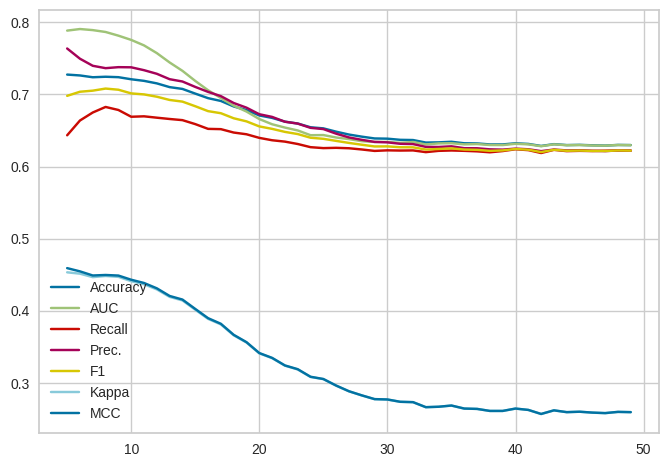

In [51]:

# start a loop
models = []
results = []

for i in np.arange(5,50,1):
    model = create_model('dt', max_depth = i)
    model_results = pull().loc[['Mean']]
    models.append(model)
    results.append(model_results)
    
results = pd.concat(results, axis=0)
results.index = np.arange(5,50,1)
results.plot()

In [22]:


# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('cardio_train') 

# init setup
from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'cardio')

# train logistic regression
dtf=create_model('dt', max_depth = 8)

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


,Description,Value
0,Session id,8034
1,Target,cardio
2,Target type,Binary
3,Original data shape,"(70000, 13)"
4,Transformed data shape,"(70000, 13)"
5,Transformed train set shape,"(49000, 13)"
6,Transformed test set shape,"(21000, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7271,0.7901,0.6483,0.7693,0.7036,0.4542,0.4599
1,0.7267,0.7891,0.7373,0.7217,0.7294,0.4535,0.4536
2,0.7251,0.7843,0.6630,0.7566,0.7067,0.4501,0.4536
3,0.7196,0.7858,0.6867,0.7347,0.7099,0.4392,0.4401
4,0.7324,0.7952,0.6703,0.7650,0.7146,0.4648,0.4684
5,0.7376,0.7964,0.6733,0.7724,0.7195,0.4751,0.4790
6,0.7200,0.7746,0.7052,0.7265,0.7157,0.4400,0.4402
7,0.7151,0.7817,0.6644,0.7392,0.6998,0.4302,0.4324
8,0.7337,0.7937,0.6962,0.7524,0.7232,0.4673,0.4686


In [35]:
#模型预测

predict_model(dtf).iloc[:,:-1]


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,0.7306,0.7885,0.6508,0.7741,0.7071,0.4612,0.4671


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,prediction_label
54385,77568,21302,1,157,55.0,120,80,1,1,0,0,1,0,0
56299,80338,23345,2,179,96.0,120,80,3,1,0,0,1,1,1
27314,39055,21497,1,170,69.0,130,80,1,1,0,0,1,0,1
23890,34151,18309,1,165,65.0,120,80,1,1,0,0,1,1,0
10093,14391,21147,1,160,96.0,110,70,3,1,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7763,11089,21032,1,175,80.0,11500,90,1,1,0,0,1,1,1
13421,19156,17433,1,150,62.0,120,80,1,1,0,0,0,1,0
40704,58166,18099,2,182,128.0,130,100,3,3,1,1,0,0,1
9410,13416,19116,2,185,70.0,120,80,1,1,1,1,1,0,0


In [36]:
# load dataset 
from pycaret.datasets import get_data 
diabetes2 = get_data('my_data') 

# # init setup
# from pycaret.classification import * 
# clf1 = setup(data = diabetes, target = 'cardio')

# functional API
predictions = predict_model(dtf, data=diabetes2 )
predictions.head().iloc[:,:-1]

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,7819,1,187,85,110,80,0,1,0,0,1,0


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Decision Tree Classifier,1.0000,0,0.0000,0.0000,0.0000,nan,0.0000


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,prediction_label
0,0,7819,1,187,85,110,80,0,1,0,0,1,0,0


In [47]:
#重写模型

# # load dataset 
# from pycaret.datasets import get_data 
# insurance= get_data('insurance') 

# # init setup
# from pycaret.regression import * 
# reg1 = setup(data = insurance, target = 'charges')

# # create custom estimator
# import numpy as np
# from sklearn.base import BaseEstimator
# class MyOwnModel(BaseEstimator):
    
#     def __init__(self):
#         self.mean = 0
        
#     def fit(self, X, y):
#         self.mean = y.mean()
#         return self
    
#     def predict(self, X):
#         return np.array(X.shape[0]*[self.mean])
        
# # create an instance
# my_own_model = MyOwnModel()

# # train model
# my_model_trained = create_model(my_own_model)

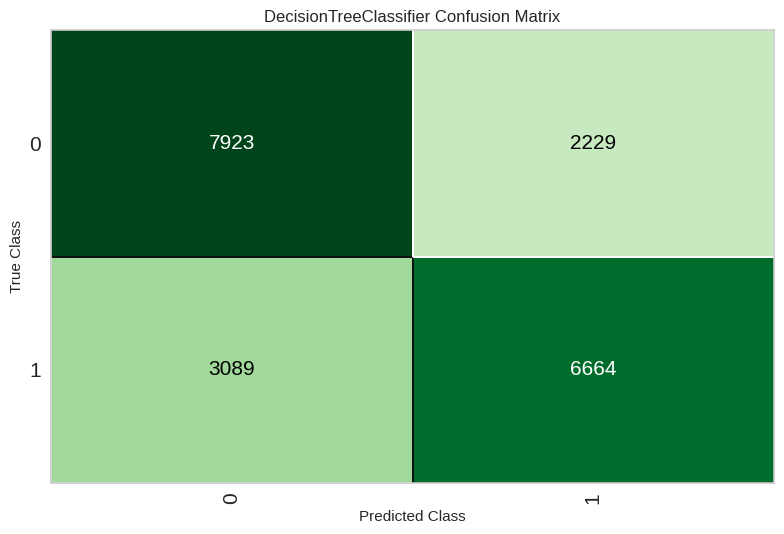

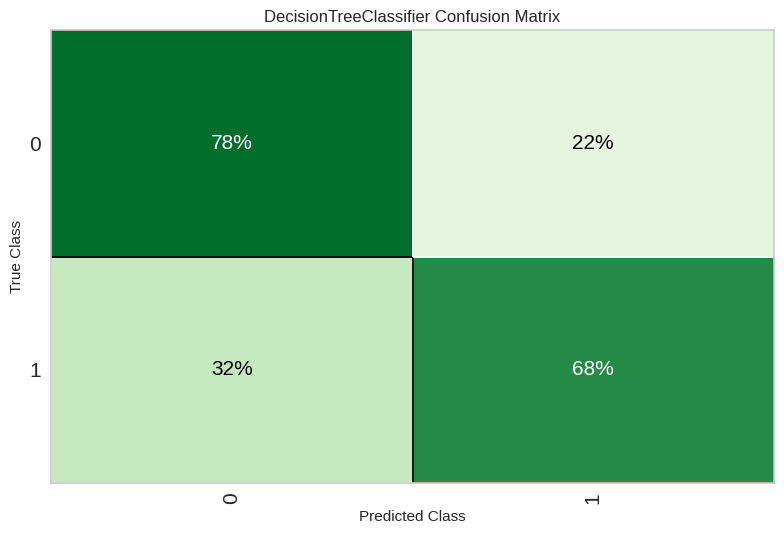

In [80]:
plot_model(dtf, plot = 'confusion_matrix')
plot_model(dtf, plot = 'confusion_matrix', plot_kwargs = {'percent' : True})

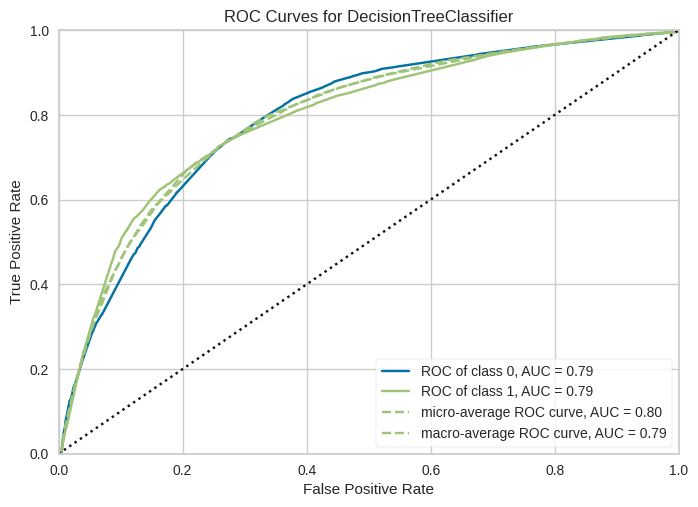

In [58]:
plot_model(dtf, plot = 'auc')

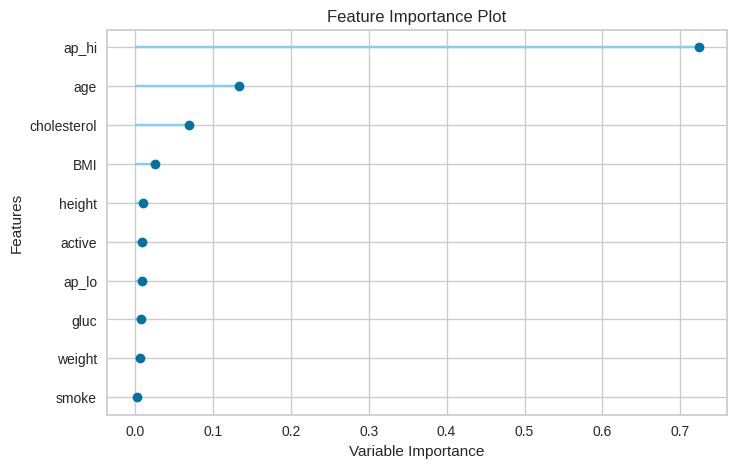

In [60]:
plot_model(dtf, plot = 'feature')

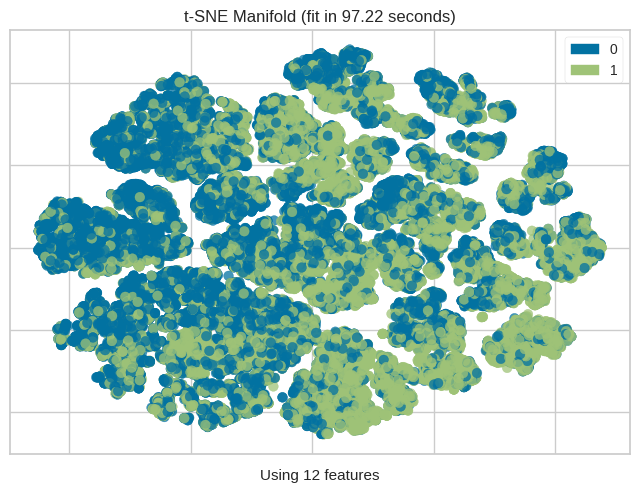

In [61]:
plot_model(dtf, plot = 'manifold')

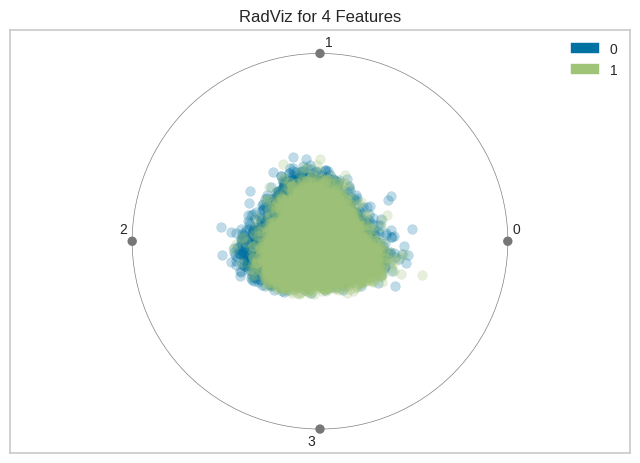

In [62]:
plot_model(dtf, plot = 'dimension')

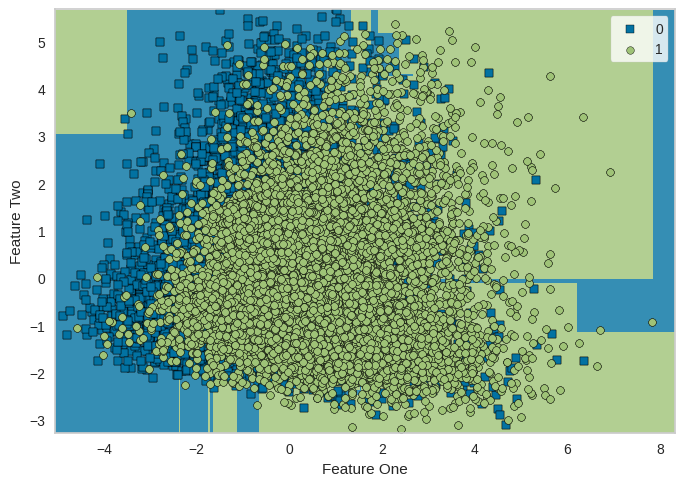

In [63]:
plot_model(dtf, plot = 'boundary')

In [65]:
#模型解释---------------------------------_

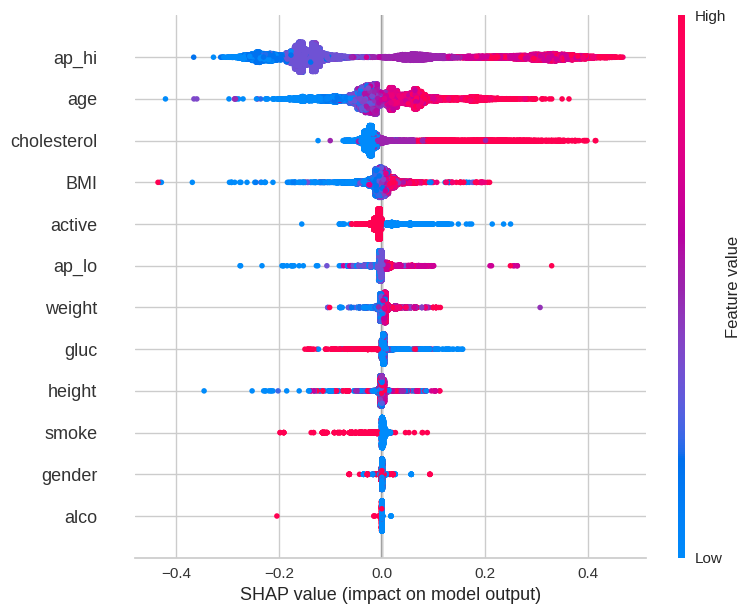

In [66]:

# interpret model
interpret_model(dtf)

In [81]:
type(dtf)

sklearn.tree._classes.DecisionTreeClassifier

In [82]:
dir(dtf)

['__abstractmethods__',
 '__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__sklearn_clone__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_abc_impl',
 '_build_request_for_signature',
 '_check_feature_names',
 '_check_n_features',
 '_compute_missing_values_in_feature_mask',
 '_estimator_type',
 '_fit',
 '_get_default_requests',
 '_get_metadata_request',
 '_get_param_names',
 '_get_tags',
 '_more_tags',
 '_parameter_constraints',
 '_prune_tree',
 '_repr_html_',
 '_repr_html_inner',
 '_repr_mimebundle_',
 '_support_missing_values',
 '_validate_X_predict',
 '_validate_data',
 '_validate_params',
 'apply',
 'ccp_alpha',
 'class_weight',
 'classes_',
 'cost_comple

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.910397 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.910397 to fit



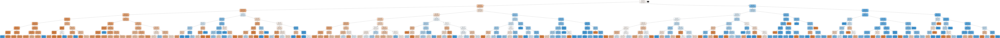

In [97]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image

# 导出决策树为dot格式
dot_data = export_graphviz(dtf, out_file=None, 
                           feature_names=X.columns,  
                           class_names=['Class 0', 'Class 1'],  
                           filled=True, rounded=True,  
                           special_characters=True)  

# 使用pydotplus将dot格式转换为图像
graph = pydotplus.graph_from_dot_data(dot_data)

# 将图像保存到本地文件夹
graph.write_png("decision_tree.svg")

# 显示图像
img = Image(graph.create_png())
display(img)


In [ ]:
model = create_model('dt', max_depth = i)
    model_results = pull().loc[['Mean']]

In [105]:
#----------------------------------------
# load dataset 
from pycaret.datasets import get_data 
diabetes = get_data('cardio_train') 

# init setup
from pycaret.classification import * 
clf1 = setup(data = diabetes, target = 'cardio')

dtf2= create_model('dt', max_depth = 8)


,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


,Description,Value
0,Session id,5110
1,Target,cardio
2,Target type,Binary
3,Original data shape,"(70000, 13)"
4,Transformed data shape,"(70000, 13)"
5,Transformed train set shape,"(49000, 13)"
6,Transformed test set shape,"(21000, 13)"
7,Numeric features,12
8,Preprocess,True
9,Imputation type,simple


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7284,0.7811,0.6855,0.7494,0.7160,0.4567,0.4584
1,0.7196,0.7841,0.6618,0.7479,0.7022,0.4391,0.4421
2,0.7343,0.7979,0.6842,0.7600,0.7201,0.4685,0.4709
3,0.7235,0.7863,0.6944,0.7369,0.7150,0.4469,0.4477
4,0.7290,0.7879,0.6801,0.7534,0.7149,0.4579,0.4601
5,0.7253,0.7864,0.6672,0.7547,0.7083,0.4506,0.4536
6,0.7304,0.7881,0.7089,0.7406,0.7244,0.4608,0.4612
7,0.7331,0.7963,0.7019,0.7484,0.7244,0.4661,0.4670
8,0.7204,0.7758,0.6733,0.7431,0.7065,0.4408,0.4428


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.837774 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.837774 to fit



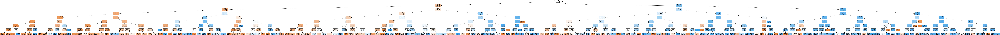

In [106]:
from sklearn.tree import export_graphviz
import pydotplus
from IPython.display import Image

# 导出决策树为dot格式
dot_data = export_graphviz(dtf2, out_file=None, 
                           feature_names=X.columns,  
                           class_names=['Class 0', 'Class 1'],  
                           filled=True, rounded=True,  
                           special_characters=True)  

# 使用pydotplus将dot格式转换为图像
graph = pydotplus.graph_from_dot_data(dot_data)

# 将图像保存到本地文件夹
graph.write_png("decision_tree_origin.png")

# 显示图像
img = Image(graph.create_png())
display(img)
